# Trying scikit-learn for contour detection

In [1]:
# core
import sys, os, re, argparse, csv
import numpy as np
import pandas as pd
from glob import glob
from scipy import spatial
import tqdm
from datetime import datetime
from tqdm import tqdm, tqdm_notebook
# plotting
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
%matplotlib inline
# Comment the next line out if not using a retina display
%config InlineBackend.figure_format ='retina'
from IPython.display import Image
from ipywidgets import *
# image recognition
import cv2
import imutils
import PIL.Image
from pytesseract import image_to_string
import pytesseract
from skimage import measure, feature
from scipy import ndimage as ndi
## sckit stuff
from skimage import io, data
from skimage.util import img_as_float
from skimage.segmentation import (morphological_chan_vese,
                                  morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient,
                                  checkerboard_level_set)
import skimage as ski

### Contour finding

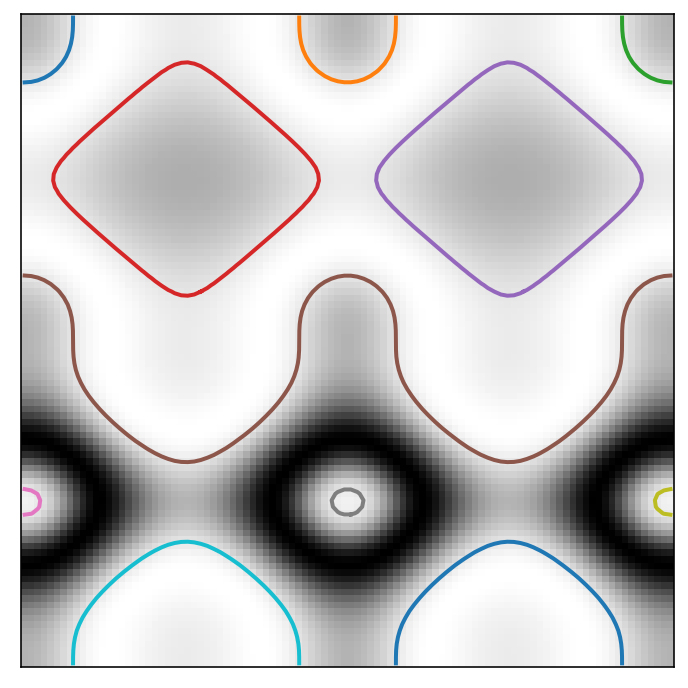

In [3]:
# Construct some test data
x, y = np.ogrid[-np.pi:np.pi:100j, -np.pi:np.pi:100j]
r = np.sin(np.exp((np.sin(x)**3 + np.cos(y)**2)))

# Find contours at a constant value of 0.8
contours = measure.find_contours(r, 0.8)

# Display the image and plot all contours found
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(r, cmap=plt.cm.gray)

for n, contour in enumerate(contours):
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)

ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()

### Canny edge detection

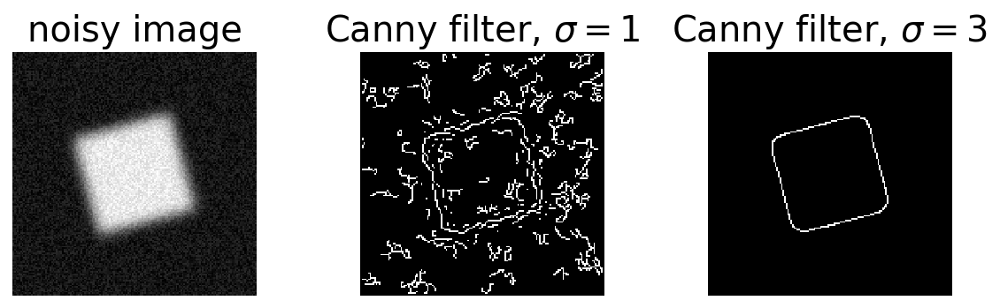

In [6]:
# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndi.rotate(im, 15, mode='constant')
im = ndi.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

In [40]:
astronaut = ski.data.astronaut()
print(np.shape(astronaut))
astronaut_img = img_as_float(ski.data.astronaut()[::2, ::2])
print(np.shape(astronaut_img))

segments_fz = ski.segmentation.felzenszwalb(astronaut_img, scale=100, sigma=0.5, min_size=50)
segments_slic = ski.segmentation.slic(astronaut_img, n_segments=250, compactness=10, sigma=1)
segments_quick = ski.segmentation.quickshift(astronaut_img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = ski.filters.sobel(ski.color.rgb2gray(astronaut_img))
segments_watershed = ski.segmentation.watershed(gradient, markers=250, compactness=0.001)

(512, 512, 3)
(256, 256, 3)


In [43]:
print(np.shape(test_image))
test_image_img = img_as_float(test_image[::2, ::2])
print(np.shape(test_image_img))

segments_fz = ski.segmentation.felzenszwalb(test_image_img, scale=100, sigma=0.5, min_size=50)
segments_slic = ski.segmentation.slic(test_image_img, n_segments=250, compactness=10, sigma=1)
segments_quick = ski.segmentation.quickshift(test_image_img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = ski.filters.sobel(ski.color.rgb2gray(test_image_img))
segments_watershed = ski.segmentation.watershed(gradient, markers=250, compactness=0.001)

(561, 600, 3)
(281, 300, 3)


In [104]:
def skimage_reader(path):
    return img_as_float(io.imread(path)[::2, ::2])

In [49]:
slide_img = img_as_float(io.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")[::2, ::2])

Felzenszwalb number of segments: 4394
SLIC number of segments: 126
Quickshift number of segments: 19871


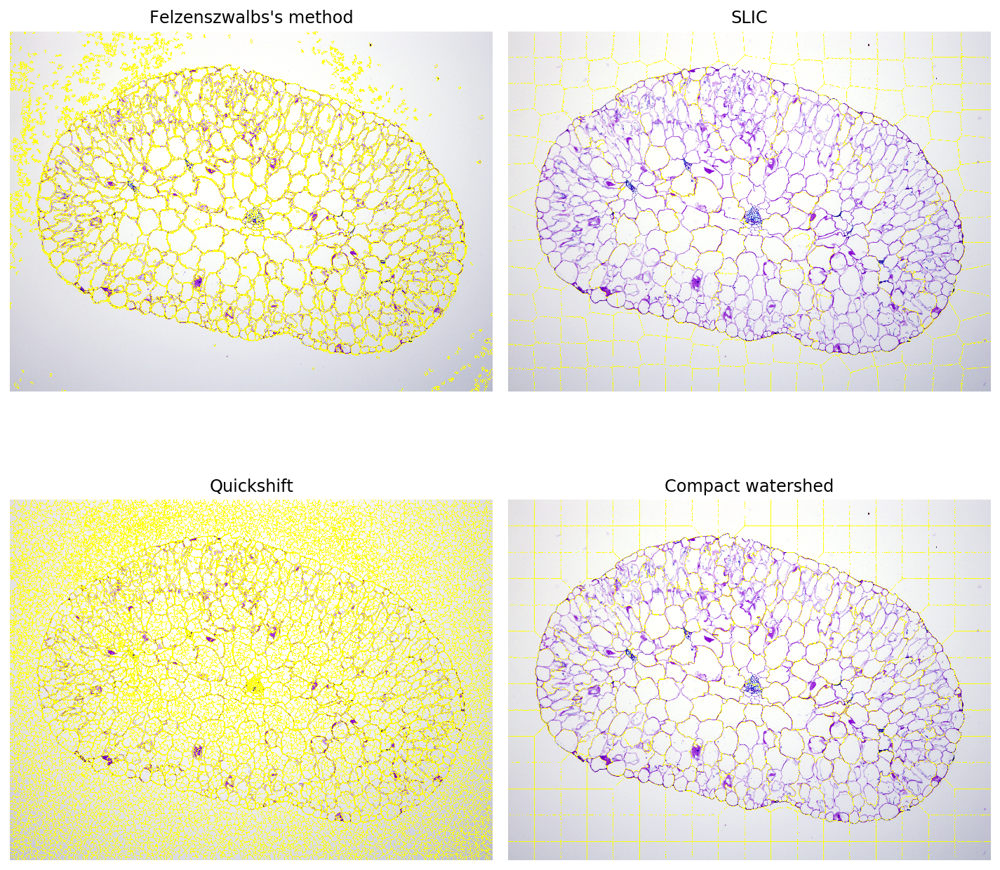

In [50]:
slide_img = img_as_float(io.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")[::2, ::2])
segments_fz = ski.segmentation.felzenszwalb(slide_img, scale=100, sigma=0.5, min_size=50)
segments_slic = ski.segmentation.slic(slide_img, n_segments=250, compactness=10, sigma=1)
segments_quick = ski.segmentation.quickshift(slide_img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = ski.filters.sobel(ski.color.rgb2gray(slide_img))
segments_watershed = ski.segmentation.watershed(gradient, markers=250, compactness=0.001)

print(f"Felzenszwalb number of segments: {len(np.unique(segments_fz))}")
print(f"SLIC number of segments: {len(np.unique(segments_slic))}")
print(f"Quickshift number of segments: {len(np.unique(segments_quick))}")

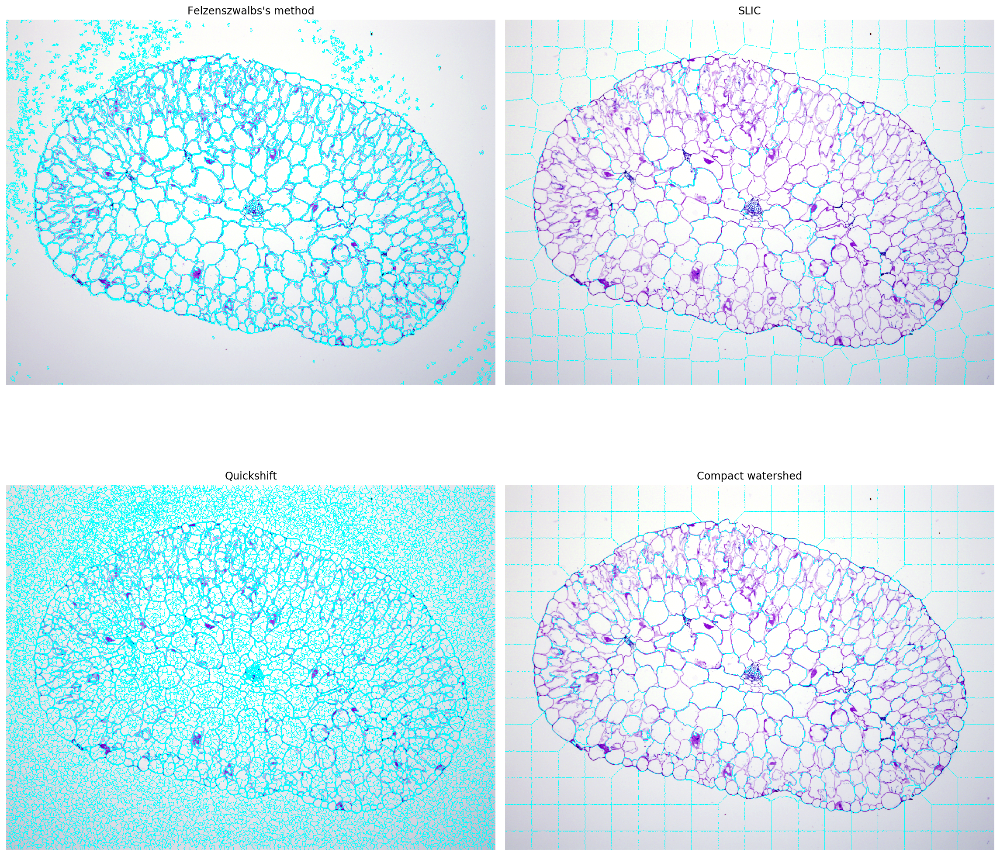

In [53]:
fig, ax = plt.subplots(2, 2, figsize=(16, 16), sharex=True, sharey=True)

ax[0, 0].imshow(ski.segmentation.mark_boundaries(slide_img, segments_fz, color=(0,1,1)))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(ski.segmentation.mark_boundaries(slide_img, segments_slic, color=(0,1,1)))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(ski.segmentation.mark_boundaries(slide_img, segments_quick, color=(0,1,1)))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(ski.segmentation.mark_boundaries(slide_img, segments_watershed, color=(0,1,1)))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

In [57]:
def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))

    return _store

In [76]:
gray_slide = ski.color.rgb2gray(slide_img)

### Morphological ACWE

In [94]:
# Morphological ACWE
acwe_image = gray_slide.copy()

# Initial level set
acwe_init_ls = checkerboard_level_set(image_shape=acwe_image.shape, square_size=6)
# List with intermediate results for plotting the evolution
acwe_evolution = []
acwe_callback = store_evolution_in(acwe_evolution)
acwe_ls = morphological_chan_vese(image=acwe_image, iterations=500, init_level_set=acwe_init_ls, 
                             smoothing=3, iter_callback=acwe_callback)

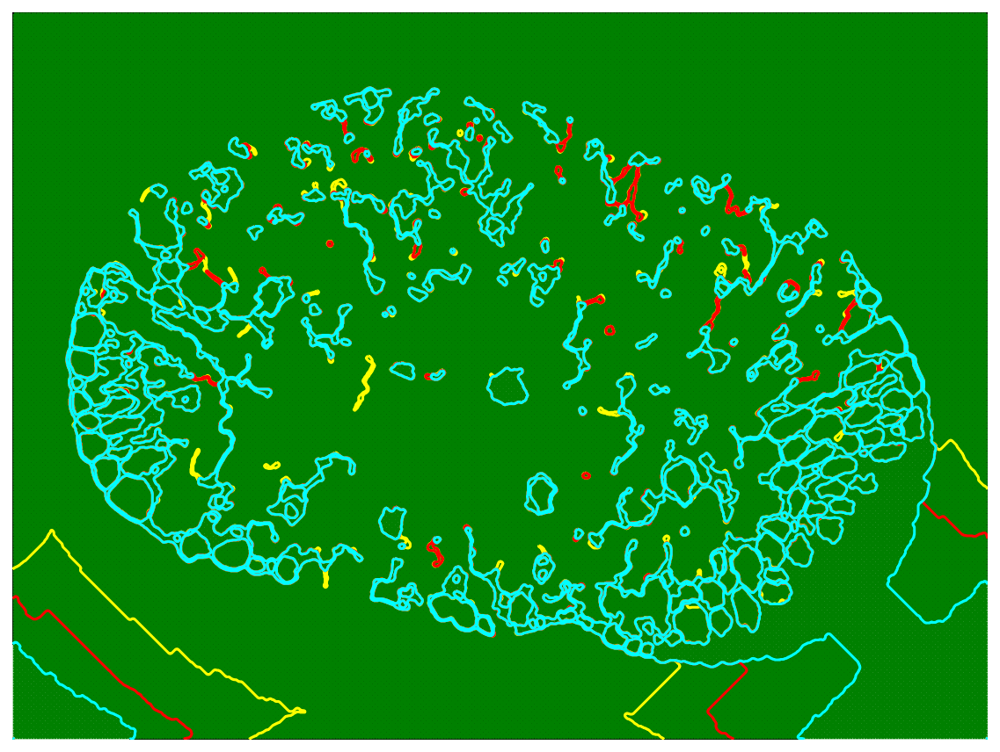

In [96]:
fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(acwe_ls, cmap="gray")
ax.set_axis_off()
contour = ax.contour(acwe_evolution[0], [0.5], colors='green')
contour.collections[0].set_label("Iteration 0")
contour = ax.contour(acwe_evolution[100], [0.5], colors='yellow')
contour.collections[0].set_label("Iteration 100")
contour = ax.contour(acwe_evolution[250], [0.5], colors='red')
contour.collections[0].set_label("Iteration 250")
contour = ax.contour(acwe_evolution[-1], [0.5], colors='cyan')
contour.collections[0].set_label("Iteration 500")

plt.tight_layout()

### Morphological GAC

In [86]:
# Morphological GAC
image = gray_slide.copy()
gimage = inverse_gaussian_gradient(image)

# Initial level set
init_ls = np.zeros(shape=image.shape, dtype=np.int8)
init_ls[10:-10, 10:-10] = 1
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = morphological_geodesic_active_contour(gimage=gimage, iterations=500, init_level_set=init_ls, smoothing=1, 
                                           balloon=-1, threshold=0.69, iter_callback=callback)

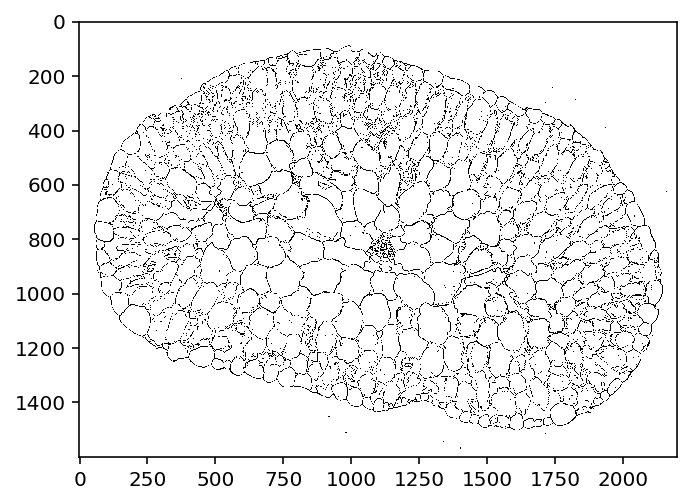

In [158]:
masked_sperg = skimage_reader("/Users/iangilman/Desktop/masked_spergularina.tif")[400:2000, 100:2300]
gthresh_sperg = skimage_reader("/Users/iangilman/Desktop/gathresh_spergularina.tif")
gray_gthresh_sperg = ski.color.rgb2gray(gthresh_sperg)
plt.imshow(gray_gthresh_sperg, cmap="gray");

In [258]:
gthresh_sperg = skimage_reader("/Users/iangilman/Desktop/gathresh_spergularina.tif")
gray_gthresh_sperg = ski.color.rgb2gray(gthresh_sperg)

# Morphological GAC
gimage = inverse_gaussian_gradient(gray_gthresh_sperg.copy())

# Initial level set
init_ls = np.zeros(shape=gray_gthresh_sperg.shape, dtype=np.int8)
init_ls[10:-10, 10:-10] = 1
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = morphological_geodesic_active_contour(gimage=gimage, iterations=200, init_level_set=init_ls, smoothing=1, 
                                           balloon=-1, threshold=0.99, iter_callback=callback)

In [259]:
def g(i):
    
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(ls, cmap="gray")
    ax.set_axis_off()
    ax.imshow(gray_gthresh_sperg, cmap="gray")
    contour = ax.contour(evolution[i], [0.5], colors='cyan')
    
interactive_plot = interactive(g, i=widgets.IntSlider(min=0, max=200, step=10, value=0))
interactive_plot

interactive(children=(IntSlider(value=0, description='i', max=200, step=10), Output()), _dom_classes=('widget-…

# Issue
So this GAC method works great on imaged with reduce size but quickly slows down and is outpaced by flood fill once images get over a few thousand pixels (I think?) and also require more iterations to fill in the space. Need to figure out a way to reduce the file size and then blow it back up for the original image.

In [254]:
# %%timeit
# Morphological GAC
gimage = inverse_gaussian_gradient(gray_gthresh_sperg.copy())

# Initial level set
init_ls = np.zeros(shape=gray_gthresh_sperg.shape, dtype=np.int8)
init_ls[10:-10, 10:-10] = 1
# List with intermediate results for plotting the evolution
# evolution = []
# callback = store_evolution_in(evolution)
ls = morphological_geodesic_active_contour(gimage=gimage, iterations=200, init_level_set=init_ls, smoothing=1, 
                                           balloon=-1, threshold=0.9,)# iter_callback=callback)

In [238]:
background = ski.img_as_ubyte(ls)

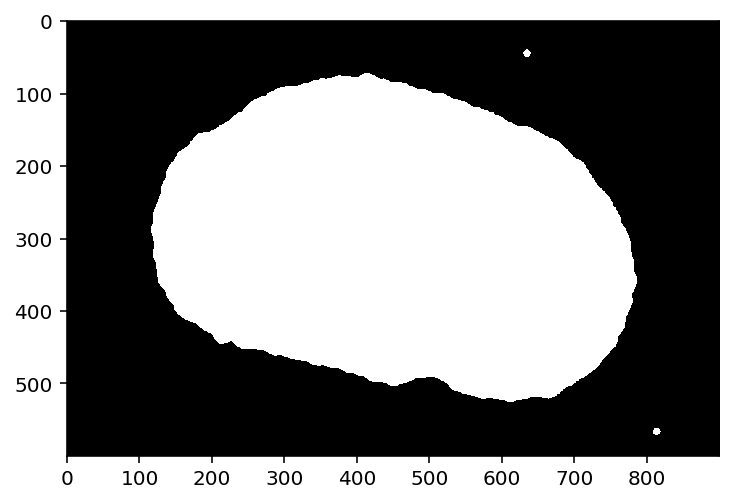

In [239]:
plt.imshow(background, cmap="gray");

In [175]:
background_image, background_contours, background_hierarchy = cv2.findContours(image=background.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
border_contour = [max(background_contours, key=cv2.contourArea)]

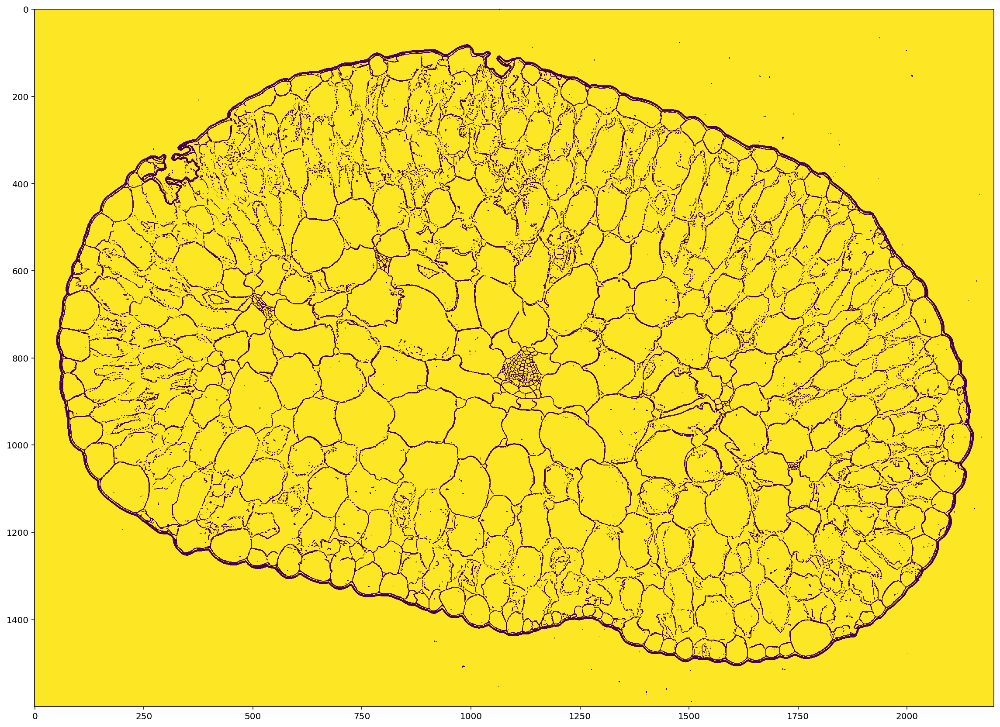

In [177]:
fig, ax = plt.subplots(figsize=(16,16))

canvas = gray_gthresh_sperg.copy()
draw_border = cv2.drawContours(image=canvas, contours=border_contour, contourIdx=-1, color=(0,255,255), thickness=3)
ax.imshow(canvas)

plt.tight_layout()

In [250]:
spergularina = cv2.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")

"""1. Gray"""
gray = cv2.cvtColor(src = spergularina.copy(), code=cv2.COLOR_RGB2GRAY)
# Kernel size for blurring in pizels
k_blur = 9

"""2. Blur"""
blur = cv2.GaussianBlur(src=gray, ksize=(k_blur, k_blur), sigmaX=2)
# Constant subtracted from the mean or weighted mean
C = 3
# Neighborhood size in pixel for calculating threshold
blocksize = 15

"""3. Adaptive Gaussian threshold"""
thresh = cv2.adaptiveThreshold(src=blur, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

In [253]:
print(thresh.shape)
thresh

(3072, 4116)


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [255]:
print(gthresh_sperg.shape)
gthresh_sperg

(600, 900, 4)


array([[[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.]],

       [[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.]],

       [[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.]],

       ...,

       [[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.]],

       [[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.]],

       [[1., 1., 1., 0.],
        [1., 1., 1., 0.],
        [1., 1., 1., 0.],
        ...,
        [1., 1., 1., 0.],
        [1., 1.

In [245]:
# Morphological GAC
sk_compat = img_as_float(thresh)
gray_gthresh_sperg = ski.color.rgb2gray(sk_compat)
gimage = inverse_gaussian_gradient(gray_gthresh_sperg)
# Initial level set
init_ls = np.zeros(shape=sk_compat.shape, dtype=np.int8)
init_ls[10:-10, 10:-10] = 1
# List with intermediate results for plotting the evolution
print("GAC")
ls = morphological_geodesic_active_contour(gimage=gimage, iterations=200, init_level_set=init_ls, 
                                smoothing=1, balloon=-1, threshold=0.9)#, iter_callback=callback)
# Convert back to cv2
background = img_as_ubyte(ls)
print("Get contours")
background_image, background_contours, background_hierarchy = cv2.findContours(image=background.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
border_contour = [max(background_contours, key=cv2.contourArea)]

(3072, 4116)

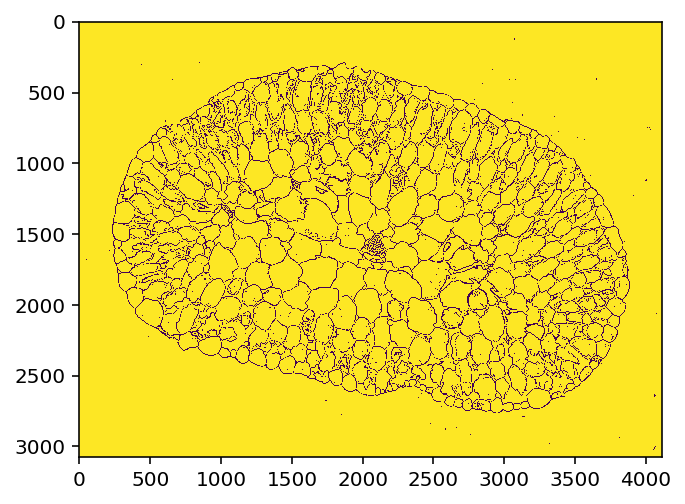

In [244]:
plt.imshow(gray_gthresh_sperg)

# Scratch

In [2]:
def flood_fill(image):
    """Flood fill from the edges."""
    mirror = image.copy()
    height, width = image.shape[:2]
    for row in range(height):
        if mirror[row, 0] == 255:
            cv2.floodFill(mirror, None, (0, row), 0)
        if mirror[row, width-1] == 255:
            cv2.floodFill(mirror, None, (width-1, row), 0)

    for col in tqdm(range(width), desc='Flooding background', leave=False):
        if mirror[0, col] == 255:
            cv2.floodFill(mirror, None, (col, 0), 0)
        if image[height-1, col] == 255:
            cv2.floodFill(mirror, None, (col, height-1), 0)

    return mirror

In [3]:
sperg = cv2.imread("../Data/sandbox_data/C_spergularina_step2.tif")

In [67]:
image = cv2.imread("../Data/sandbox_data/C_spergularina_step2.tif")
gray = cv2.cvtColor(src = image, code=cv2.COLOR_RGB2GRAY)
k_blur=9
C=3
blocksize=15
k_laplacian=5
k_dilate=5
k_gradient=3
k_foreground=7

"""Adaptive histogram normalization"""
gridsize = int(min(0.01*max(image.shape[:2]), 8))
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(gridsize, gridsize))
hequalized = clahe.apply(gray)

"""Blur"""
blur = cv2.GaussianBlur(src=hequalized, ksize=(k_blur, k_blur), sigmaX=2, )

"""Adaptive Gaussian threshold"""
thresh = cv2.adaptiveThreshold(src=blur, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

"""Laplacian"""
laplacian = cv2.Laplacian(src=thresh, ddepth=cv2.CV_16S, ksize=k_laplacian,)

"""Dilate"""
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_dilate, k_dilate))
dilate = cv2.dilate(laplacian, kernel=kernel, iterations=1)

"""Morphological gradient"""
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
gradient = cv2.morphologyEx(dilate, cv2.MORPH_GRADIENT, kernel=kernel, iterations=1)

"""Binarize"""
binary_otsu = cv2.threshold(np.uint8(thresh), 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)[1]

"""Foreground clean up"""
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k_foreground, k_foreground))
foreground_otsu = cv2.morphologyEx(binary_otsu, cv2.MORPH_OPEN, kernel, iterations=1)
foreground_otsu = cv2.morphologyEx(foreground, cv2.MORPH_CLOSE, kernel, iterations=1)

foreground = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
foreground = cv2.morphologyEx(foreground, cv2.MORPH_CLOSE, kernel, iterations=1)

In [68]:
new_img, contours_otsu, hierarchy = cv2.findContours(image=foreground_otsu.copy(), mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
new_img, contours, hierarchy = cv2.findContours(image=foreground.copy(), mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

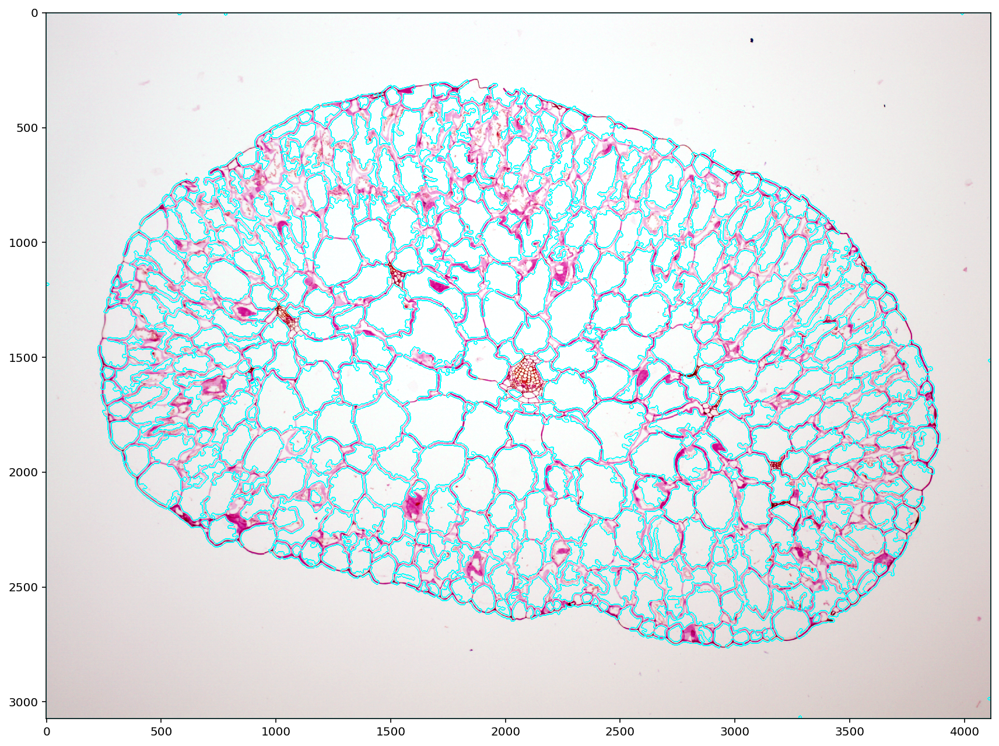

In [69]:
fig, ax = plt.subplots(nrows=1, figsize=(12,12))
canvas = np.uint8(image.copy())
cv2.drawContours(canvas, [c for c in contours_otsu if cv2.contourArea(c) > 1000], -1, (0, 255, 255), 3)
# cv2.drawContours(canvas, [c for c in contours if cv2.contourArea(c) > 1000], -1, (255, 255, 0), 3)
ax.imshow(canvas)
plt.tight_layout()

In [ ]:
"""Flood from outside"""
if debug: print("Flood fill...")
if skip_flood:
    flood = foreground.copy()
else:
    flood = flood_fill(foreground)
if extract_border:
    """Get border"""
    if debug: print("Getting border...")
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
    background = cv2.dilate(flood, kernel, iterations=2)
    background_image, background_contours, background_hierarchy = cv2.findContours(image=background.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
    border_contour = [max(background_contours, key=cv2.contourArea)]
    return border_contour

"""Find contours"""
if debug: print("Drawing contours...")
new_img, contours, hierarchy = cv2.findContours(image=flood.copy(), mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)
